<a href="https://colab.research.google.com/github/BagusRezky/PCVK_Ganjil_2023/blob/main/Week7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Bagus Rezky Adhyaksa
# TI- 3H
# 2141720210

In [1]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import math
from google.colab.patches import cv2_imshow
from PIL import Image as im

## Konvolusi tanpa Library


In [3]:
def convolution2d(image, kernel, stride, padding):
  # Penambahan padding ke citra asli
  # Jika padding lebih dari 0, tambahkan padding ke citra.
    # Padding berfungsi untuk mempertahankan ukuran citra atau mengatur dimensi output setelah konvolusi.
    if padding > 0:
      # Membuat citra dengan padding (bernilai nol) berdasarkan ukuran padding yang diberikan.
        image_padded = np.zeros((image.shape[0] + 2*padding, image.shape[1] + 2*padding))

        # Menempatkan citra asli ke citra dengan padding
        image_padded[padding:-padding, padding:-padding] = image
    else:
       # Jika tidak ada padding, gunakan citra asli
        image_padded = image

    # Membuat citra keluaran dengan dimensi yang sesuai
    output_height = int((image_padded.shape[0] - kernel.shape[0])/stride) + 1
    output_width = int((image_padded.shape[1] - kernel.shape[1])/stride) + 1
    output = np.zeros((output_height, output_width))

    # Melakukan konvolusi
    for x in range(0, image_padded.shape[1] - kernel.shape[1] + 1, stride):
        for y in range(0, image_padded.shape[0] - kernel.shape[0] + 1, stride):
          # Mengalikan elemen dari bagian citra dengan kernel dan menjumlahkannya
            # Hasilnya ditempatkan pada matriks output
            output[y//stride, x//stride] = np.sum(image_padded[y:y+kernel.shape[0], x:x+kernel.shape[1]] * kernel)

    return output


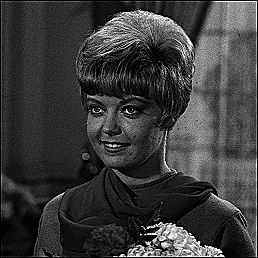

In [4]:
# Operasi Sharpen

img = cv.imread('/content/drive/MyDrive/Colab/female.tiff')
img_gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)

kernel_sharpen = np.array([[0,-1,0],
                           [-1,5,-1],
                           [0,-1,0]])

output = convolution2d(img_gray,kernel_sharpen,1,2)


cv2_imshow(output)

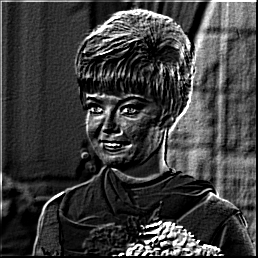

In [5]:
# Operasi Embos

img = cv.imread('/content/drive/MyDrive/Colab/female.tiff')
img_gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)

kernel_sharpen = np.array([[-2,-1,0],
                           [-1,1,1],
                           [0,1,2]])

output = convolution2d(img_gray,kernel_sharpen,1,2)


cv2_imshow(output)

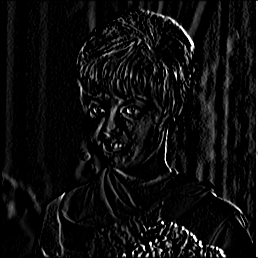

In [6]:
# Operasi Left Sobel Edge Detection
img = cv.imread('/content/drive/MyDrive/Colab/female.tiff')
img_gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)

kernel_sharpen = np.array([[1,0,-1],
                           [2,0,-2],
                           [1,0,-1]])

output = convolution2d(img_gray,kernel_sharpen,1,2)


cv2_imshow(output)

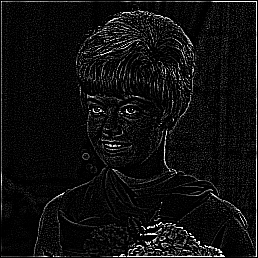

In [7]:
# Canny Edge Detection

img = cv.imread('/content/drive/MyDrive/Colab/female.tiff')
img_gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)

kernel_sharpen = np.array([[-1,-1,-1],
                           [-1,8,-1],
                           [-1,-1,-1]])

output = convolution2d(img_gray,kernel_sharpen,1,2)


cv2_imshow(output)

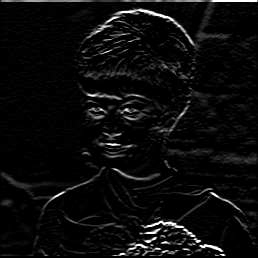

In [8]:
# Operasi Prewitt Edge Detection

img = cv.imread('/content/drive/MyDrive/Colab/female.tiff')
img_gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)

kernel_sharpen = np.array([[-1,-1,-1],
                           [0,0,0],
                           [1,1,1]])

output = convolution2d(img_gray,kernel_sharpen,1,2)


cv2_imshow(output)

[[0.00390625 0.015625   0.0234375  0.015625   0.00390625]
 [0.015625   0.0625     0.09375    0.0625     0.015625  ]
 [0.0234375  0.09375    0.140625   0.09375    0.0234375 ]
 [0.015625   0.0625     0.09375    0.0625     0.015625  ]
 [0.00390625 0.015625   0.0234375  0.015625   0.00390625]]


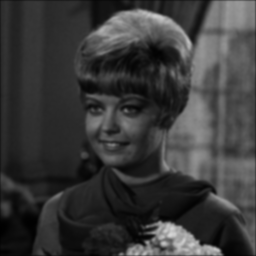

In [9]:
# Operasi 5x5 Gaussian Blur

img = cv.imread('/content/drive/MyDrive/Colab/female.tiff')
img_gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)

a = 1/256
b = np.array([[1,4,6,4,1],
              [4,16,24,16,4],
              [6,24,36,24,6],
              [4,16,24,16,4],
              [1,4,6,4,1]])

kernel_sharpen = np.dot(a,b)
print(kernel_sharpen)

output = convolution2d(img_gray,kernel_sharpen,1,2)


cv2_imshow(output)

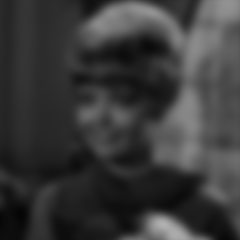

In [10]:
# Operasi 21x21 Gaussian Blur

kernel_size = 21

sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel @ gaussian_kernel.transpose()

output = convolution2d(img_gray,gauss_kernel,1,2)


cv2_imshow(output)

## Tugas

Diketahui dataset KTP dengan kondisi citra yang berbeda. Lakukan perbaikan melalui
implementasi teknik filterisasi dan detection setiap citra. Terapkan juga histogram equalization dan
operasi aritmatika sebagai Teknik pendukung perbaikan citra KTP.

In [11]:
def Brightness (image, brightness):
  brightness_image = np.zeros(image.shape, image.dtype)

  for y in range(image.shape[0]):
    for x in range(image.shape[1]):
      for c in range(image.shape[2]):
        brightness_image[y,x,c] = np.clip(image[y,x,c] + brightness, 0, 255)

  return brightness_image

def hist_equ (image):
  channels = cv.split(image)
  eq_channels = []
  for ch, color in zip(channels, ["r", "g", "b"]):
    eq_channels.append(cv.equalizeHist(ch))

  eq_image = cv.merge(eq_channels)

  return eq_image

def adjust_contrast(image, alpha):
  adjusted_image = cv2.convertScaleAbs(image, alpha=alpha, beta=0)
  return adjusted_image

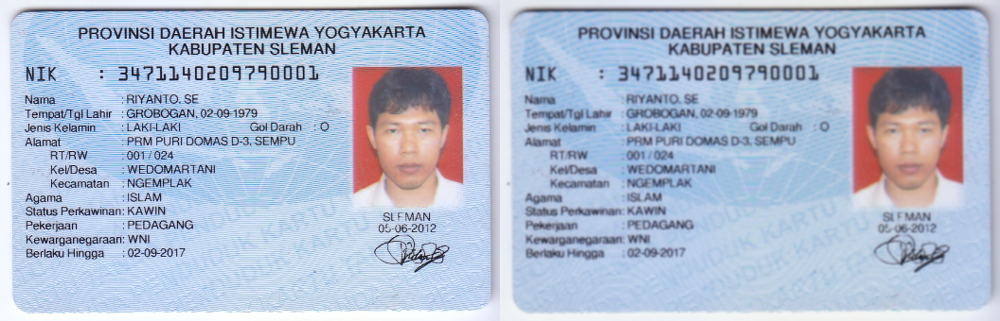

In [12]:
import cv2
ktp = cv.imread('/content/drive/MyDrive/Colab/KTPW7/Salinan ktp.png')
KTP = cv.resize(ktp, (0,0), fx=0.5, fy=0.5)
brightness = Brightness(KTP, -10)
result = cv2.filter2D(brightness, -1, kernel_sharpen)
final_frame = cv.hconcat((KTP, result))
cv2_imshow(final_frame)

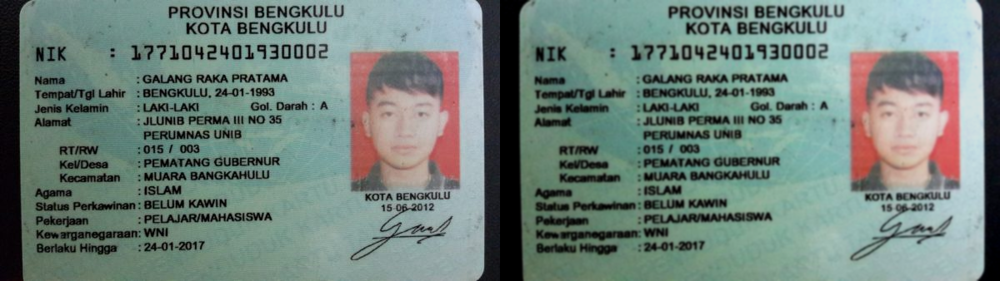

In [13]:
ktp1 = cv.imread('/content/drive/MyDrive/Colab/KTPW7/Salinan ktp1.png')
contrast = adjust_contrast(ktp1, 1.3)
brightness = Brightness(contrast, -30)
result = cv2.filter2D(brightness, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp1, result))
cv2_imshow(final_frame)

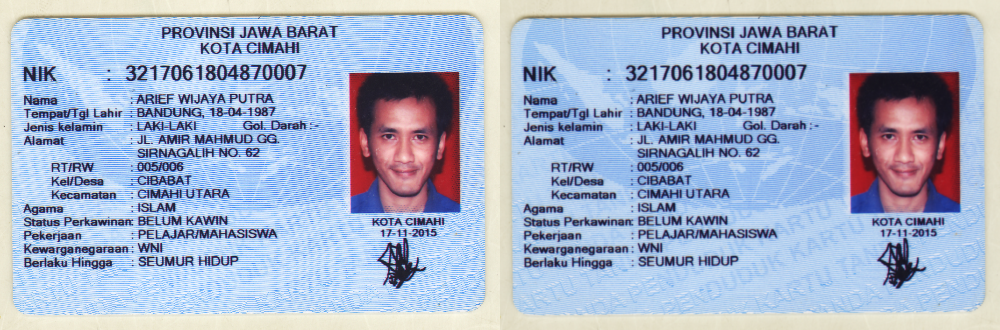

In [14]:
ktp2 = cv.imread('/content/drive/MyDrive/Colab/KTPW7/Salinan ktp2.png')
brightness = Brightness(ktp2, -10)
result = cv2.filter2D(brightness, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp2, result))
cv2_imshow(final_frame)

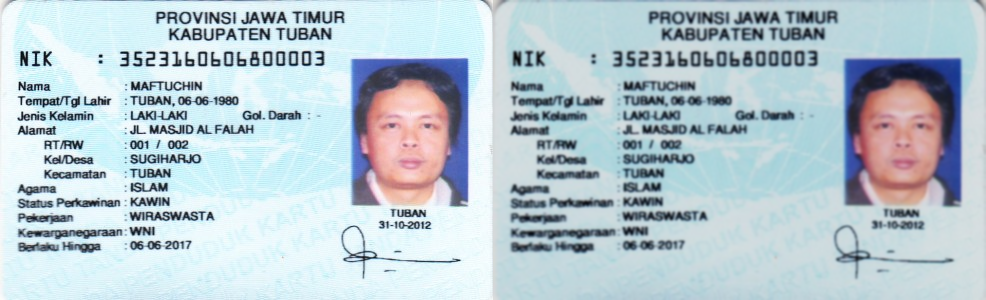

In [16]:
ktp3 = cv.imread('/content/drive/MyDrive/Colab/KTPW7/Salinan ktp3.png')
brightness = Brightness(ktp3, -30)
result = cv2.filter2D(brightness, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp3, result))
cv2_imshow(final_frame)

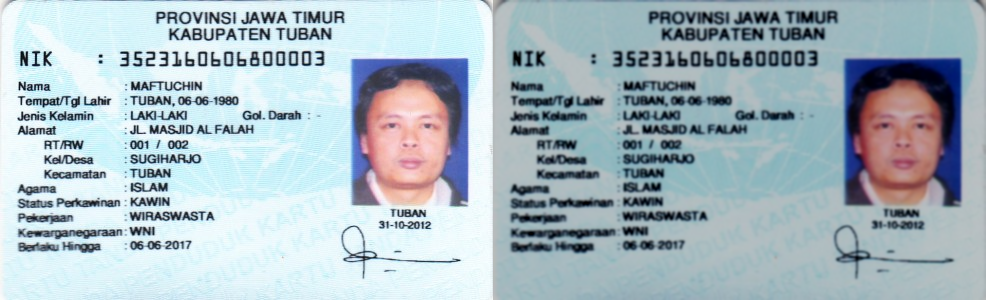

In [17]:
ktp4 = cv.imread('/content/drive/MyDrive/Colab/KTPW7/Salinan ktp4.png')
contrast = adjust_contrast(ktp4, 1.2)
brightness = Brightness(result, -30)
result = cv2.filter2D(contrast, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp4, brightness))
cv2_imshow(final_frame)


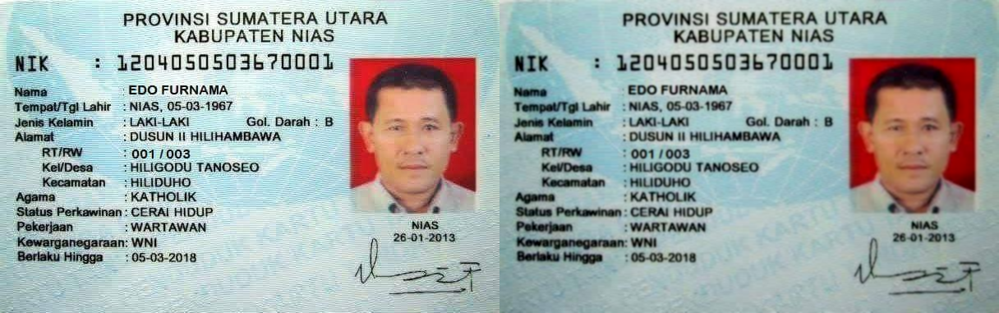

In [18]:
ktp5 = cv.imread('/content/drive/MyDrive/Colab/KTPW7/Salinan ktp5.png')
conv = cv2.filter2D(ktp5, -1, kernel_sharpen)
brightness = Brightness(conv, -30)
final_frame = cv.hconcat((ktp5, brightness))
cv2_imshow(final_frame)


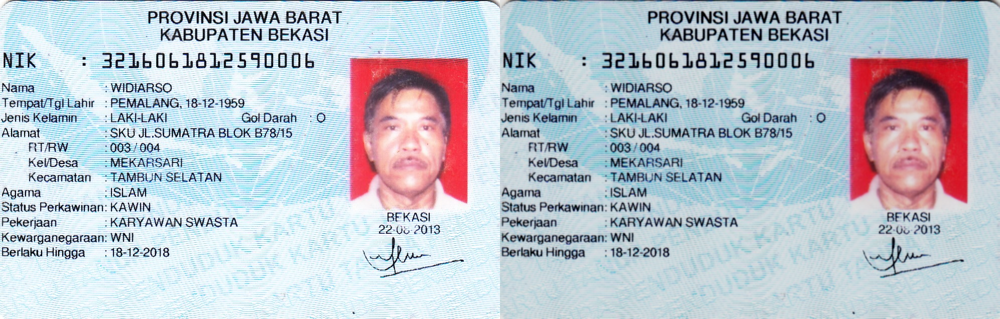

In [19]:
ktp6 = cv.imread('/content/drive/MyDrive/Colab/KTPW7/Salinan ktp6.png')
conv = cv2.filter2D(ktp6, -1, kernel_sharpen)
brightness = Brightness(conv, -30)
final_frame = cv.hconcat((ktp6, brightness))
cv2_imshow(final_frame)

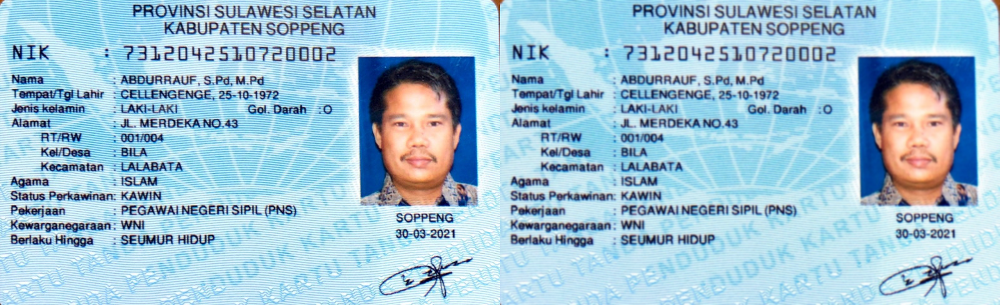

In [23]:
ktp7 = cv.imread('/content/drive/MyDrive/Colab/KTPW7/Salinan KTP7.jpeg')
conv = cv2.filter2D(ktp7, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp7, conv))
cv2_imshow(final_frame)